In [1]:
import sys
import regions
import pyavm
import numpy as np
import PIL

from astropy.io import fits
from astropy.wcs import WCS
from astropy.wcs.utils import proj_plane_pixel_scales
from astropy.visualization import simple_norm

import reproject 
from reproject.mosaicking import find_optimal_celestial_wcs, reproject_and_coadd
import matplotlib.pyplot as plt
from matplotlib.colors import rgb_to_hsv, hsv_to_rgb

from astropy.table import Table
from astropy.nddata import Cutout2D
from astropy.coordinates import SkyCoord
from astropy import units as u

from reproject import reproject_interp

from spectral_cube import SpectralCube
from spectral_cube import Projection

from photutils.background import MMMBackground, MADStdBackgroundRMS, Background2D
from photutils import background

import regions
import cv2

import warnings

from astropy.visualization.wcsaxes import add_scalebar
from astropy.visualization.wcsaxes import add_beam

# Helper Functions

In [2]:
def get_cutout(filename, position, l, w, format='fits'):
    if format == 'fits':
        try: 
            hdu = fits.open(filename)
            data = np.squeeze(hdu['SCI'].data)
            head = hdu['SCI'].header
        except: 
            hdu = fits.open(filename)[0]
            data = np.squeeze(hdu.data)
            head = hdu.header
    elif format == 'casa':
        hdu = SpectralCube.read(filename, format='casa').hdu
        data = np.squeeze(hdu.data)
        head = hdu.header
    #pixel_scale = head['PIXSCALE']*u.arcsec/u.pix
    ww = WCS(head).celestial
    size = (l, w)
    #((l/pixel_scale).to(u.pix), (w/pixel_scale).to(u.pix))
    cutout = Cutout2D(data, position=position, size=size, wcs=ww)
    return cutout

def get_cutout_405(position, l, w):
    fn = '/orange/adamginsburg/jwst/cloudc/images/F405_reproj_merged-fortricolor.fits'
    return get_cutout(fn, position, l, w)
    
def get_cutout_410(position, l, w):
    fn = '/orange/adamginsburg/jwst/cloudc/images/F410_reproj_merged-fortricolor.fits'
    return get_cutout(fn, position, l, w)

def get_cutout_466(position, l, w):
    fn = '/orange/adamginsburg/jwst/cloudc/images/F466_reproj_merged-fortricolor.fits'
    return get_cutout(fn, position, l, w)

def get_cutout_187(position, l, w):
    fn = '/orange/adamginsburg/jwst/cloudc/images/F187_reproj_merged-fortricolor.fits'
    return get_cutout(fn, position, l, w)
    
def get_cutout_182(position, l, w):
    fn = '/orange/adamginsburg/jwst/cloudc/images/F182_reproj_merged-fortricolor.fits'
    return get_cutout(fn, position, l, w)

def get_cutout_212(position, l, w):
    fn = '/orange/adamginsburg/jwst/cloudc/images/F212_reproj_merged-fortricolor.fits'
    return get_cutout(fn, position, l, w)

def get_cutout_rgb(position, l, w):
    #filename_R = '/orange/adamginsburg/jwst/cloudc/images/F405_reproj_merged-fortricolor.fits'
    filename_R = '/orange/adamginsburg/jwst/cloudc/images/F466_reproj_merged-fortricolor.fits'
    filename_B = '/orange/adamginsburg/jwst/cloudc/images/F405_reproj_merged-fortricolor.fits'
    #filename_B = '/orange/adamginsburg/jwst/cloudc/images/F405_reproj_merged-fortricolor.fits'
    cutout_R = get_cutout(filename_R, position, l, w)
    cutout_B = get_cutout(filename_B, position, l, w)
    cutout_G = cutout_R.data + cutout_B.data
    rgb = np.array(
        [
            cutout_R.data,
            cutout_G,
            cutout_B.data
        ]
    ).swapaxes(0,2).swapaxes(0,1)
    rgb_scaled = np.array([
        simple_norm(rgb[:,:,0], stretch='asinh', min_cut=-1, max_cut=90)(rgb[:,:,0]),
        simple_norm(rgb[:,:,1], stretch='asinh', min_cut=-2, max_cut=210)(rgb[:,:,1]),
        simple_norm(rgb[:,:,2], stretch='asinh', min_cut=-1, max_cut=120)(rgb[:,:,2]),
    ]).swapaxes(0,2)
    return rgb_scaled.swapaxes(0,1), cutout_R.wcs

def get_cutout_466_410(position, l, w):
    #filename_R = '/orange/adamginsburg/jwst/cloudc/images/F405_reproj_merged-fortricolor.fits'
    filename_R = '/orange/adamginsburg/jwst/cloudc/images/F466_reproj_merged-fortricolor.fits'
    filename_B = '/orange/adamginsburg/jwst/cloudc/images/F410_reproj_merged-fortricolor.fits'
    #filename_B = '/orange/adamginsburg/jwst/cloudc/images/F405_reproj_merged-fortricolor.fits'
    cutout_R = get_cutout(filename_R, position, l, w)
    cutout_B = get_cutout(filename_B, position, l, w)
    cutout_G = cutout_R.data + cutout_B.data
    rgb = np.array(
        [
            cutout_R.data,
            cutout_G,
            cutout_B.data
        ]
    ).swapaxes(0,2).swapaxes(0,1)
    rgb_scaled = np.array([
        simple_norm(rgb[:,:,0], stretch='asinh', min_cut=-1, max_cut=90)(rgb[:,:,0]),
        simple_norm(rgb[:,:,1], stretch='asinh', min_cut=-2, max_cut=210)(rgb[:,:,1]),
        simple_norm(rgb[:,:,2], stretch='asinh', min_cut=-1, max_cut=120)(rgb[:,:,2]),
    ]).swapaxes(0,2)
    return rgb_scaled.swapaxes(0,1), cutout_R.wcs

def get_cutout_rgb3(position, l, w):
    #filename_R = '/orange/adamginsburg/jwst/cloudc/images/F405_reproj_merged-fortricolor.fits'
    filename_R = '/orange/adamginsburg/jwst/cloudc/images/F405_reproj_merged-fortricolor.fits'
    filename_G = '/orange/adamginsburg/jwst/cloudc/images/F212_reproj_merged-fortricolor.fits'
    filename_B = '/orange/adamginsburg/jwst/cloudc/images/F187_reproj_merged-fortricolor.fits'
    cutout_R = get_cutout(filename_R, position, l, w)
    cutout_G = get_cutout(filename_G, position, l, w)
    cutout_B = get_cutout(filename_B, position, l, w)
    
    rgb = np.array(
        [
            cutout_R.data,
            cutout_G.data,
            cutout_B.data
        ]
    ).swapaxes(0,2).swapaxes(0,1)
    rgb_scaled = np.array([
        simple_norm(rgb[:,:,0], stretch='asinh', min_cut=-1, max_cut=120)(rgb[:,:,0]),
        simple_norm(rgb[:,:,1], stretch='asinh', min_cut=-2, max_cut=210)(rgb[:,:,1]),
        simple_norm(rgb[:,:,2], stretch='asinh', min_cut=-1, max_cut=120)(rgb[:,:,2]),
    ]).swapaxes(0,2)
    return rgb_scaled.swapaxes(0,1), cutout_R.wcs

def get_cutout_rgb_short(position, l, w):
    #filename_R = '/orange/adamginsburg/jwst/cloudc/images/F405_reproj_merged-fortricolor.fits'
    filename_R = '/orange/adamginsburg/jwst/cloudc/images/F212_reproj_merged-fortricolor.fits'
    filename_G = '/orange/adamginsburg/jwst/cloudc/images/F187_reproj_merged-fortricolor.fits'
    filename_B = '/orange/adamginsburg/jwst/cloudc/images/F182_reproj_merged-fortricolor.fits'
    cutout_R = get_cutout(filename_R, position, l, w)
    cutout_G = get_cutout(filename_G, position, l, w)
    cutout_B = get_cutout(filename_B, position, l, w)
    
    rgb = np.array(
        [
            cutout_R.data,
            cutout_G.data,
            cutout_B.data
        ]
    ).swapaxes(0,2).swapaxes(0,1)
    rgb_scaled = np.array([
        simple_norm(rgb[:,:,0], stretch='asinh', min_cut=-1, max_cut=120)(rgb[:,:,0]),
        simple_norm(rgb[:,:,1], stretch='asinh', min_cut=-2, max_cut=210)(rgb[:,:,1]),
        simple_norm(rgb[:,:,2], stretch='asinh', min_cut=-1, max_cut=120)(rgb[:,:,2]),
    ]).swapaxes(0,2)
    return rgb_scaled.swapaxes(0,1), cutout_R.wcs

def get_miri(position, l, w):
    miri_fn = '/orange/adamginsburg/jwst/cloudc/images/jw02221-o001_t001_miri_f2550w_realigned-to-refcat.fits'
    cutout_miri = get_cutout(miri_fn, position, l, w)
    return cutout_miri

def get_step_list(data, N=9, multiplier=0.5):
    std = np.nanstd(data)
    mean = np.nanmean(data)
    #start = mean + 5*std
    start = mean + 0.5*std
    step = 4*std
    arr = [multiplier*step*i + start for i in range(N)]
    return np.array(arr)

def get_alma(position, l, w):
    B6_cont_fn = '/orange/adamginsburg/jwst/cloudc/alma/member.uid___A001_X1590_X282a.CloudC_sci.spw29.mfs.I.manual.image.pbcor.fits'
    cutout_alma = get_cutout(B6_cont_fn, position, l, w)
    return cutout_alma

def plot_cont_contour(ax, position, l, w):
    cutout = get_alma(position, l-0.5*u.arcsec, w-0.5*u.arcsec)
    
    ax.contour(cutout.data, transform=ax.get_transform(cutout.wcs), 
               levels=get_step_list(cutout.data), 
               colors='lime', linewidths=1.)

# Catalog

In [3]:
cd /orange/adamginsburg/jwst/cloudc/analysis/

/blue/adamginsburg/adamginsburg/jwst/cloudc/code/brick-jwst-2221/analysis


In [4]:
#%run selections.py

/blue/adamginsburg/adamginsburg/jwst/cloudc/code/brick-jwst-2221/analysis/selections.py:2: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import sys, imp
/blue/adamginsburg/adamginsburg/jwst/cloudc/code/brick-jwst-2221/analysis/selections.py:23: DeprecationWarning: `photutils.CircularAperture` is a deprecated alias for `photutils.aperture.CircularAperture` and will be removed in the future. Instead, please use `from photutils.aperture import CircularAperture` to silence this warning.
  from photutils import CircularAperture, EPSFBuilder, find_peaks, CircularAnnulus
/blue/adamginsburg/adamginsburg/jwst/cloudc/code/brick-jwst-2221/analysis/selections.py:23: DeprecationWarning: `photutils.EPSFBuilder` is a deprecated alias for `photutils.psf.EPSFBuilder` and will be removed in the future. Instead, please use `from photutils.psf import EPSFBuilder` to silence this warning.
  from photutils import CircularApertu

I don't want to have to open these if I don't need to.
no daophot stuff done for cloud c yet...
For module merged catalog crowdsource_nsky0_merged_photometry_tables_merged.fits, mod date is 2024-06-02 23:47:29
For module merged-reproject catalog crowdsource_nsky0_merged-reproject_photometry_tables_merged.fits, mod date is 2024-03-07 02:34:45
Selecting module merged

merged-reproject
5789 saturated in near_saturated_f212n_f212n
788 saturated in near_saturated_f466n_f466n
2035 saturated in near_saturated_f405n_f405n
5511 saturated in near_saturated_f187n_f187n
11218 saturated in near_saturated_f182m_f182m
20674 near saturated out of 788969.  That leaves 768295 not near unsaturated
462 saturated in replaced_saturated_f212n
111 saturated in replaced_saturated_f466n
256 saturated in replaced_saturated_f405n
825 saturated in replaced_saturated_f187n
817 saturated in replaced_saturated_f182m
2340 saturated out of 788969.  That leaves 786629 unsaturated
Filter f410m has qf=164840, spread=14635

In [43]:
basetable = Table.read(f'{basepath}/catalogs/crowdsource_nsky0_merged_photometry_tables_merged.fits')

# Plotting Cutout

In [5]:
position = SkyCoord('17:46:21.4669695284', '-28:35:38.1118497742', unit=(u.hourangle, u.deg))
pos_cand = SkyCoord('17:46:21.7948042714', '-28:35:46.2467981305', unit=(u.hourangle, u.deg))

In [6]:
l = 10 * u.arcsec
w = 10 * u.arcsec
reg_cloudc = regions.RectangleSkyRegion(center=position, width=l-0.1*u.arcsec, height=w-0.1*u.arcsec)

In [7]:
rgb_data, rgb_wcs = get_cutout_rgb3(position, l, w)
rgb_ice_data, rgb_ice_wcs = get_cutout_rgb(position, l, w)
rgb_466_410, wcs_466_410 = get_cutout_466_410(position, l, w)
#cutout_miri = get_miri(position, l, w)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


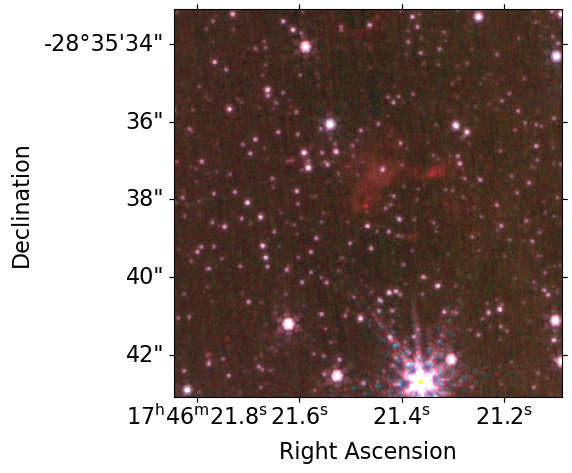

In [8]:
short_rgb, short_wcs = get_cutout_rgb_short(position, l, w)

fig = plt.figure(figsize=(6, 6))

ax1 = plt.subplot(111, projection=short_wcs)
ax1.imshow(short_rgb)
#ax1.scatter(crds_in.ra, crds_in.dec, edgecolor='white', facecolor='none', transform=ax1.get_transform('world'), s=0.5)
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


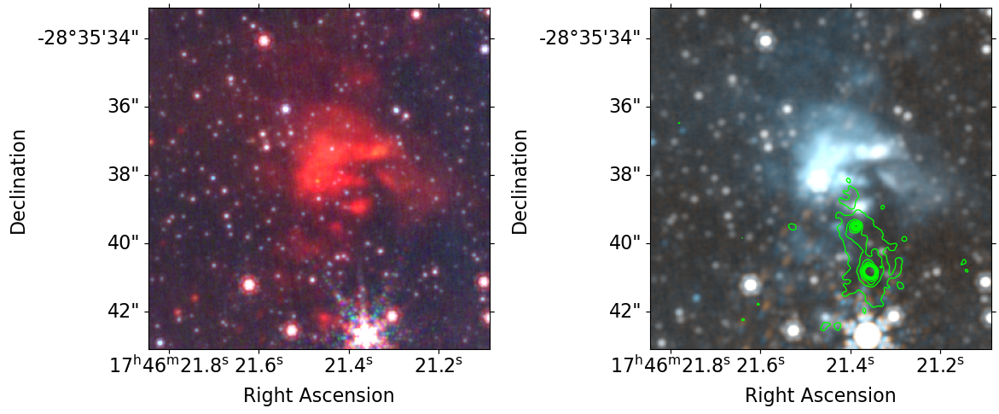

In [9]:
fig = plt.figure(figsize=(12, 6))
ax1 = plt.subplot(121, projection=rgb_wcs)
ax1.imshow(rgb_data)
#ax1.scatter(crds_in.ra, crds_in.dec, edgecolor='white', facecolor='none', transform=ax1.get_transform('world'), s=0.5)
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(122, projection=rgb_ice_wcs)
ax2.imshow(rgb_ice_data)
plot_cont_contour(ax2, position, l, w)
#ax2.scatter(crds_in.ra, crds_in.dec, edgecolor='lime', facecolor='none', transform=ax2.get_transform('world'), s=1)
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

plt.tight_layout()
plt.show()

In [10]:
crds = basetable['skycoord_ref']
crds_in = crds[reg_cloudc.contains(crds, wcs=rgb_wcs)]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


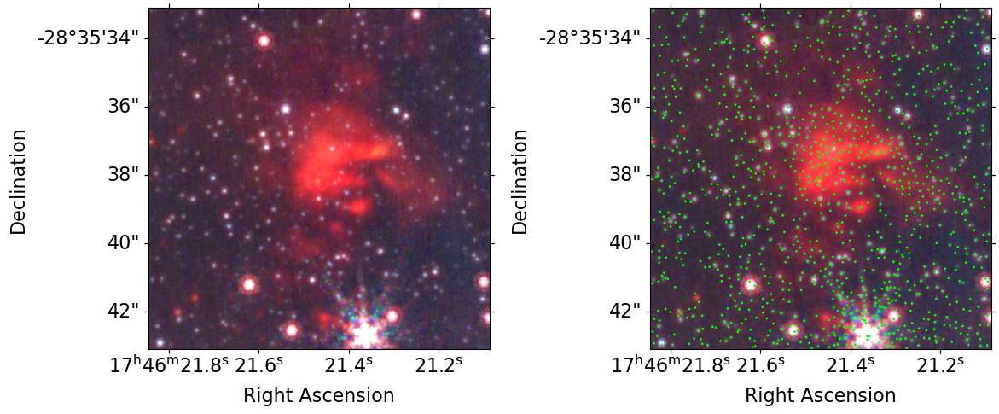

In [11]:
fig = plt.figure(figsize=(12, 6))
ax1 = plt.subplot(121, projection=rgb_wcs)
ax1.imshow(rgb_data)
#ax1.scatter(crds_in.ra, crds_in.dec, edgecolor='white', facecolor='none', transform=ax1.get_transform('world'), s=0.5)
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(122, projection=rgb_wcs)
ax2.imshow(rgb_data)
ax2.scatter(crds_in.ra, crds_in.dec, edgecolor='lime', facecolor='none', transform=ax2.get_transform('world'), s=1)
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

plt.tight_layout()
plt.show()

In [12]:
mask = basetable['mag_ab_f182m'] - basetable['mag_ab_f410m'] > 0
crds_m = basetable[mask]['skycoord_ref']
crds_m_in = crds_m[reg_cloudc.contains(crds_m, wcs=rgb_wcs)]

crds = basetable['skycoord_ref']
crds_in = crds[reg_cloudc.contains(crds, wcs=rgb_wcs)]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


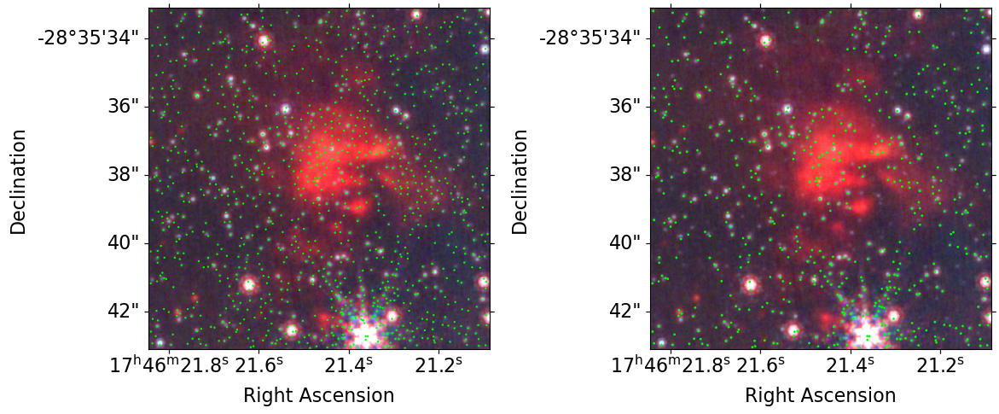

In [13]:
fig = plt.figure(figsize=(12, 6))
ax1 = plt.subplot(121, projection=rgb_wcs)
ax1.imshow(rgb_data)
ax1.scatter(crds_in.ra, crds_in.dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=0.5)
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(122, projection=rgb_wcs)
ax2.imshow(rgb_data)
ax2.scatter(crds_m_in.ra, crds_m_in.dec, edgecolor='lime', facecolor='none', transform=ax2.get_transform('world'), s=1)
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

plt.tight_layout()
plt.show()

In [44]:
crds = basetable['skycoord_ref']
base_in = basetable[reg_cloudc.contains(crds, wcs=rgb_wcs)]
crds_in = crds[reg_cloudc.contains(crds, wcs=rgb_wcs)]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


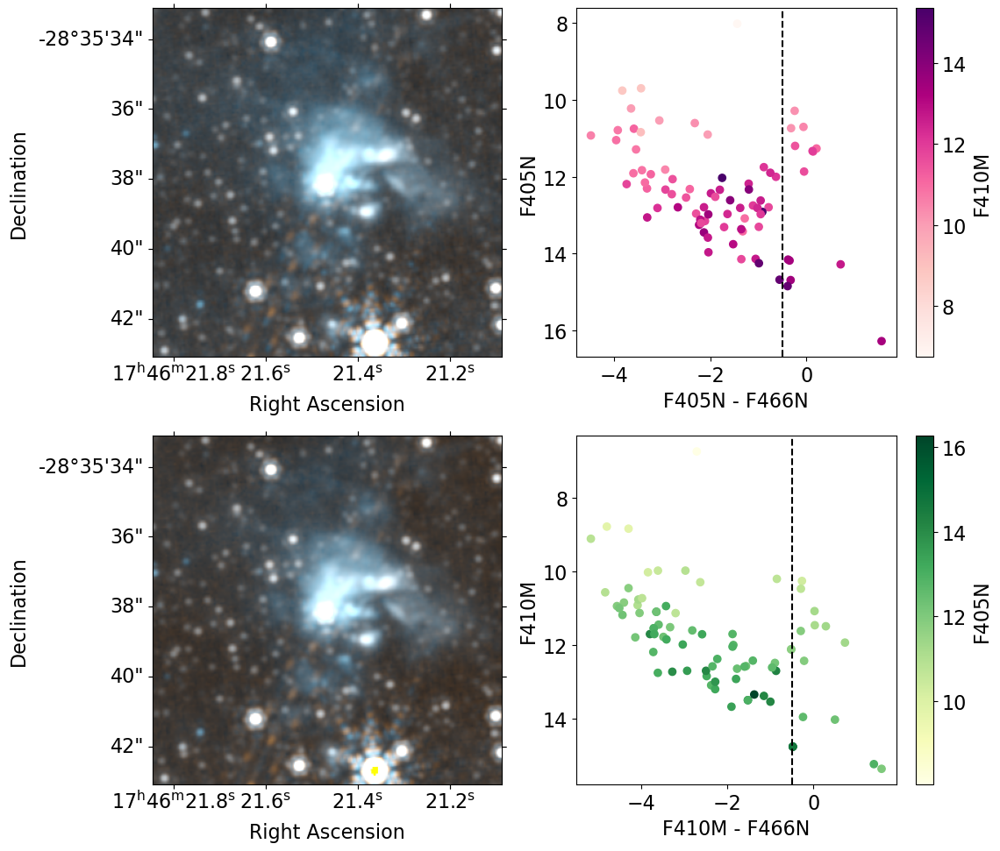

In [15]:
fig = plt.figure(figsize=(12, 10))

mag = base_in['mag_ab_f405n']
mag3 = base_in['mag_ab_f410m']
color = base_in['mag_ab_f405n'] - base_in['mag_ab_f466n']
color2 = base_in['mag_ab_f405n'] - base_in['mag_ab_f410m']
color3 = base_in['mag_ab_f410m'] - base_in['mag_ab_f466n']

color_mask = base_in['mag_ab_f405n'] - base_in['mag_ab_f466n'] < -0.5
color2_mask = base_in['mag_ab_f410m'] - base_in['mag_ab_f466n'] < -0.5
mask = color_mask#np.logical_and(color_mask, color2_mask)

#ax1 = plt.subplot(221, projection=rgb_wcs)
#ax1.imshow(rgb_data)
#ax1.scatter(crds_in.ra, crds_in.dec, edgecolor='white', facecolor='none', transform=ax1.get_transform('world'), s=0.5)
#ax1.scatter(crds_in[mask].ra, crds_in[mask].dec, edgecolor='blue', facecolor='none', transform=ax1.get_transform('world'), s=10)
ax1 = plt.subplot(221, projection=rgb_ice_wcs)
ax1.imshow(rgb_ice_data)
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(222)
im2 = ax2.scatter(color, mag, c=mag3, cmap='RdPu')#, c=color2, cmap='RdPu')
#im2 = ax2.scatter(color[mask], mag[mask], c=mag3[mask], cmap='RdPu')#, c=color2[mask], cmap='RdPu')
ax2.axvline(-0.5, color='k', ls='--')
ax2.set_xlabel('F405N - F466N')
ax2.set_ylabel('F405N')
plt.gca().invert_yaxis()

ax3 = plt.subplot(223, projection=wcs_466_410)
ax3.imshow(rgb_466_410)
#ax3.scatter(crds_in.ra, crds_in.dec, edgecolor='white', facecolor='none', transform=ax3.get_transform('world'), s=0.5)
#ax3.scatter(crds_in[mask].ra, crds_in[mask].dec, edgecolor='blue', facecolor='none', transform=ax3.get_transform('world'), s=10)
ax3.set_xlabel('Right Ascension')
ax3.set_ylabel('Declination')

ax4 = plt.subplot(224)
im4 = ax4.scatter(color3, mag3, c=mag, cmap='YlGn')#, c=color, cmap='YlGn')
#im4 = ax4.scatter(color3[mask], mag3[mask], c=mag[mask], cmap='YlGn')#, c=color[mask], cmap='YlGn')
ax4.axvline(-0.5, color='k', ls='--')
ax4.set_xlabel('F410M - F466N')
ax4.set_ylabel('F410M')
plt.gca().invert_yaxis()



cbar = fig.colorbar(im2)
cbar.ax.set_ylabel('F410M', rotation=90)

cbar = fig.colorbar(im4)
cbar.ax.set_ylabel('F405N', rotation=90)

plt.tight_layout()
plt.show()

# Catalog Completeness

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


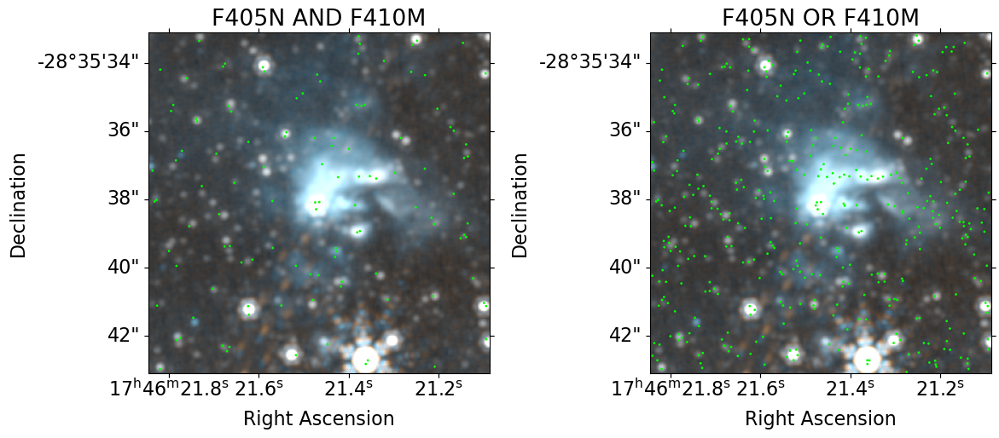

In [16]:
fig = plt.figure(figsize=(12, 6))

mask = np.logical_and(~np.isnan(base_in['mag_ab_f405n']), ~np.isnan(base_in['mag_ab_f410m']))#, ~np.isnan(base_in['mag_ab_f466n']))
mask2 = np.logical_or(~np.isnan(base_in['mag_ab_f405n']), ~np.isnan(base_in['mag_ab_f410m']))#, ~np.isnan(base_in['mag_ab_f466n']))

ax1 = plt.subplot(121, projection=rgb_ice_wcs)
ax1.imshow(rgb_ice_data)
ax1.scatter(crds_in[mask].ra, crds_in[mask].dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=1)
ax1.set_title('F405N AND F410M')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(122, projection=rgb_ice_wcs)
ax2.imshow(rgb_ice_data)
ax2.scatter(crds_in[mask2].ra, crds_in[mask2].dec, edgecolor='lime', facecolor='none', transform=ax2.get_transform('world'), s=1)
ax2.set_title('F405N OR F410M')
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

#ax = plt.subplot(122)
#ax.scatter(base_masked['mag_ab_f405n'], base_masked['mag_ab_f410m'])
#ax.scatter(base_in['mag_ab_f405n'], base_in['mag_ab_f410m'])
#ax.set_xlabel('F405N')
#ax.set_ylabel('F410M')
#plt.gca().invert_xaxis()
#plt.gca().invert_yaxis()

plt.tight_layout()
plt.show()

In [17]:
cutout_405 = get_cutout_405(position, l, w)
cutout_410 = get_cutout_410(position, l, w)
cutout_466 = get_cutout_466(position, l, w)

cutout_187 = get_cutout_187(position, l, w)
cutout_182 = get_cutout_182(position, l, w)
cutout_212 = get_cutout_212(position, l, w)


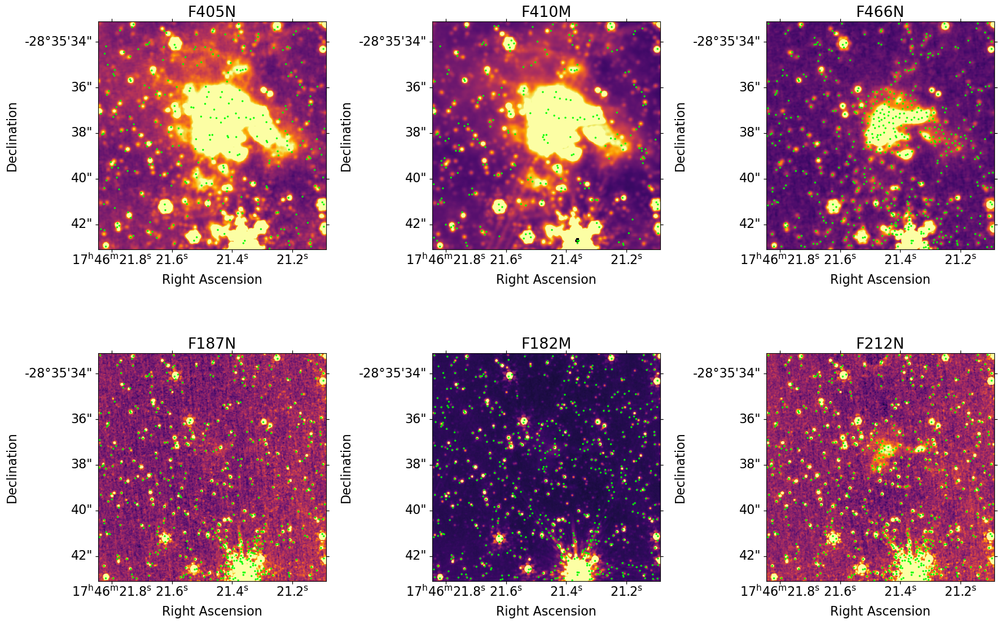

In [18]:
fig = plt.figure(figsize=(18, 12))

mask_405 = ~np.isnan(base_in['mag_ab_f405n'])
mask_410 = ~np.isnan(base_in['mag_ab_f410m'])
mask_466 = ~np.isnan(base_in['mag_ab_f466n'])
mask_187 = ~np.isnan(base_in['mag_ab_f187n'])
mask_182 = ~np.isnan(base_in['mag_ab_f182m'])
mask_212 = ~np.isnan(base_in['mag_ab_f212n'])

ax1 = plt.subplot(231, projection=cutout_405.wcs)
ax1.imshow(cutout_405.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(crds_in[mask_405].ra, crds_in[mask_405].dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2)
ax1.set_title('F405N')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(232, projection=cutout_410.wcs)
ax2.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax2.scatter(crds_in[mask_410].ra, crds_in[mask_410].dec, edgecolor='lime', facecolor='none', transform=ax2.get_transform('world'), s=2)
ax2.set_title('F410M')
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

ax3 = plt.subplot(233, projection=cutout_466.wcs)
ax3.imshow(cutout_466.data, vmin=0, vmax=25, cmap='inferno')
ax3.scatter(crds_in[mask_466].ra, crds_in[mask_466].dec, edgecolor='lime', facecolor='none', transform=ax3.get_transform('world'), s=2)
ax3.set_title('F466N')
ax3.set_xlabel('Right Ascension')
ax3.set_ylabel('Declination')

ax4 = plt.subplot(234, projection=cutout_187.wcs)
ax4.imshow(cutout_187.data, vmin=0, vmax=25, cmap='inferno')
ax4.scatter(crds_in[mask_187].ra, crds_in[mask_187].dec, edgecolor='lime', facecolor='none', transform=ax4.get_transform('world'), s=2)
ax4.set_title('F187N')
ax4.set_xlabel('Right Ascension')
ax4.set_ylabel('Declination')

ax5 = plt.subplot(235, projection=cutout_182.wcs)
ax5.imshow(cutout_182.data, vmin=0, vmax=25, cmap='inferno')
ax5.scatter(crds_in[mask_182].ra, crds_in[mask_182].dec, edgecolor='lime', facecolor='none', transform=ax5.get_transform('world'), s=2)
ax5.set_title('F182M')
ax5.set_xlabel('Right Ascension')
ax5.set_ylabel('Declination')

ax6 = plt.subplot(236, projection=cutout_212.wcs)
ax6.imshow(cutout_212.data, vmin=0, vmax=25, cmap='inferno')
ax6.scatter(crds_in[mask_212].ra, crds_in[mask_212].dec, edgecolor='lime', facecolor='none', transform=ax6.get_transform('world'), s=2)
ax6.set_title('F212N')
ax6.set_xlabel('Right Ascension')
ax6.set_ylabel('Declination')

plt.tight_layout()
plt.show()

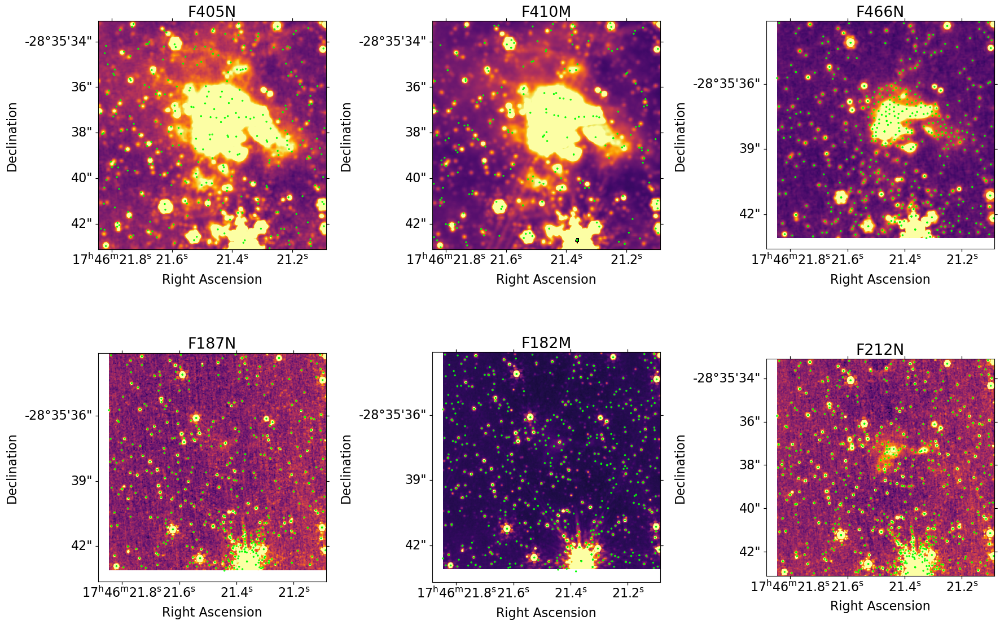

In [19]:
fig = plt.figure(figsize=(18, 12))

mask_405 = ~np.isnan(base_in['mag_ab_f405n'])
mask_410 = ~np.isnan(base_in['mag_ab_f410m'])
mask_466 = ~np.isnan(base_in['mag_ab_f466n'])
mask_187 = ~np.isnan(base_in['mag_ab_f187n'])
mask_182 = ~np.isnan(base_in['mag_ab_f182m'])
mask_212 = ~np.isnan(base_in['mag_ab_f212n'])

ax1 = plt.subplot(231, projection=cutout_405.wcs)
ax1.imshow(cutout_405.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(base_in[mask_405]['skycoord_f405n'].ra, base_in[mask_405]['skycoord_f405n'].dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2)
ax1.set_title('F405N')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(232, projection=cutout_410.wcs)
ax2.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax2.scatter(base_in[mask_410]['skycoord_f410m'].ra, base_in[mask_410]['skycoord_f410m'].dec, edgecolor='lime', facecolor='none', transform=ax2.get_transform('world'), s=2)
ax2.set_title('F410M')
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

ax3 = plt.subplot(233, projection=cutout_466.wcs)
ax3.imshow(cutout_466.data, vmin=0, vmax=25, cmap='inferno')
ax3.scatter(base_in[mask_466]['skycoord_f466n'].ra, base_in[mask_466]['skycoord_f466n'].dec, edgecolor='lime', facecolor='none', transform=ax3.get_transform('world'), s=2)
ax3.set_title('F466N')
ax3.set_xlabel('Right Ascension')
ax3.set_ylabel('Declination')

ax4 = plt.subplot(234, projection=cutout_187.wcs)
ax4.imshow(cutout_187.data, vmin=0, vmax=25, cmap='inferno')
ax4.scatter(base_in[mask_187]['skycoord_f187n'].ra, base_in[mask_187]['skycoord_f187n'].dec, edgecolor='lime', facecolor='none', transform=ax4.get_transform('world'), s=2)
ax4.set_title('F187N')
ax4.set_xlabel('Right Ascension')
ax4.set_ylabel('Declination')

ax5 = plt.subplot(235, projection=cutout_182.wcs)
ax5.imshow(cutout_182.data, vmin=0, vmax=25, cmap='inferno')
ax5.scatter(base_in[mask_182]['skycoord_f182m'].ra, base_in[mask_182]['skycoord_f182m'].dec, edgecolor='lime', facecolor='none', transform=ax5.get_transform('world'), s=2)
ax5.set_title('F182M')
ax5.set_xlabel('Right Ascension')
ax5.set_ylabel('Declination')

ax6 = plt.subplot(236, projection=cutout_212.wcs)
ax6.imshow(cutout_212.data, vmin=0, vmax=25, cmap='inferno')
ax6.scatter(base_in[mask_212]['skycoord_f212n'].ra, base_in[mask_212]['skycoord_f212n'].dec, edgecolor='lime', facecolor='none', transform=ax6.get_transform('world'), s=2)
ax6.set_title('F212N')
ax6.set_xlabel('Right Ascension')
ax6.set_ylabel('Declination')

plt.tight_layout()
plt.show()

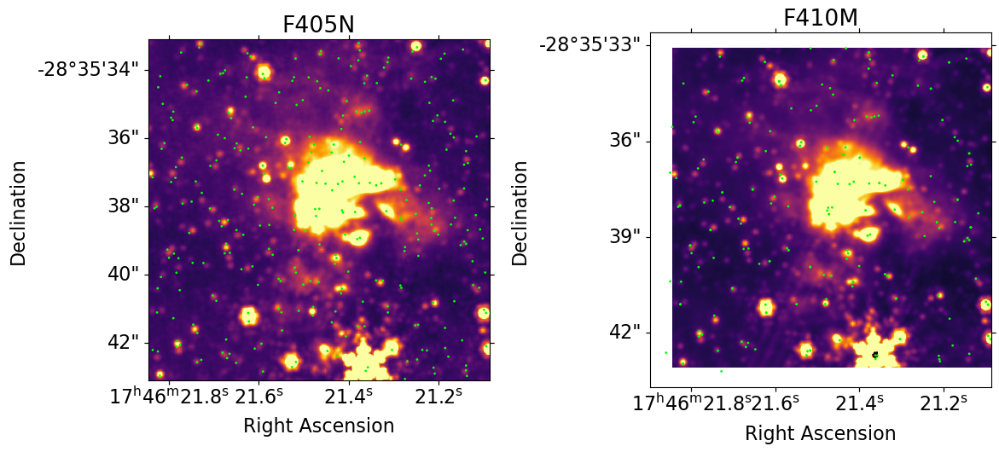

In [20]:
fig = plt.figure(figsize=(12, 6))

mask_405 = ~np.isnan(base_in['mag_ab_f405n'])
mask_410 = ~np.isnan(base_in['mag_ab_f410m'])

ax3 = plt.subplot(121, projection=cutout_405.wcs)
ax3.imshow(cutout_405.data, vmin=0, vmax=50, cmap='inferno')
ax3.scatter(base_in[mask_405]['skycoord_f405n'].ra, base_in[mask_405]['skycoord_f405n'].dec, edgecolor='lime', facecolor='none', transform=ax3.get_transform('world'), s=1)
ax3.set_title('F405N')
ax3.set_xlabel('Right Ascension')
ax3.set_ylabel('Declination')

ax4 = plt.subplot(122, projection=cutout_410.wcs)
ax4.imshow(cutout_410.data, vmin=0, vmax=50, cmap='inferno')
ax4.scatter(base_in[mask_410]['skycoord_f405n'].ra, base_in[mask_410]['skycoord_f405n'].dec, edgecolor='lime', facecolor='none', transform=ax4.get_transform('world'), s=1)
ax4.set_title('F410M')
ax4.set_xlabel('Right Ascension')
ax4.set_ylabel('Declination')

plt.tight_layout()
plt.show()

In [21]:
cat_405 = Table.read('/orange/adamginsburg/jwst/cloudc/F405N/f405n_merged_crowdsource_nsky0.fits')
cat_410 = Table.read('/orange/adamginsburg/jwst/cloudc/F410M/f410m_merged_crowdsource_nsky0.fits')
cat_466 = Table.read('/orange/adamginsburg/jwst/cloudc/F466N/f466n_merged_crowdsource_nsky0.fits')
cat_187 = Table.read('/orange/adamginsburg/jwst/cloudc/F187N/f187n_merged_crowdsource_nsky0.fits')
cat_182 = Table.read('/orange/adamginsburg/jwst/cloudc/F182M/f182m_merged_crowdsource_nsky0.fits')
cat_212 = Table.read('/orange/adamginsburg/jwst/cloudc/F212N/f212n_merged_crowdsource_nsky0.fits')

In [22]:
cat_405[:2]

x,y,flux,passno,dx,dy,dflux,qf,rchi2,fracflux,fluxlbs,dfluxlbs,fwhm,spread_model,dspread_model,fluxiso,xiso,yiso,flags,sky,skycoord
,,,,,,,,,,,,,,,,,,,,"deg,deg"
float64,float64,float32,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,int32,float32,SkyCoord
348.7761706709862,-0.499,256549.22,0.0,1e+20,1e+20,10000000000.0,0.0,0.0,0.0,0.0,0.0,2.8760355,0.0,0.0,0.0,0.0,0.0,-1073741822,6.5831127,"266.61878701429896,-28.52695306371409"
958.4199978709221,-0.0027336180210113525,19743.246,0.0,0.09773933,0.1691725,1260.7898,0.009597129,6.7434945,0.8295054,-2813.5874,1809.0392,2.8760357,0.047144055,0.0081285825,10443.604,1.231556490637492,1.1856689342403628,-1073741822,10.435607,"266.61763696206725,-28.537569821994488"


In [23]:
crds_405 = cat_405['skycoord']
crds_410 = cat_410['skycoord']
crds_466 = cat_466['skycoord']
crds_187 = cat_187['skycoord']
crds_182 = cat_182['skycoord']
crds_212 = cat_212['skycoord']

In [24]:
crds_in_405 = crds_405[reg_cloudc.contains(crds_405, wcs=rgb_wcs)]
crds_in_410 = crds_410[reg_cloudc.contains(crds_410, wcs=rgb_wcs)]
crds_in_466 = crds_466[reg_cloudc.contains(crds_466, wcs=rgb_wcs)]
crds_in_187 = crds_187[reg_cloudc.contains(crds_187, wcs=rgb_wcs)]
crds_in_182 = crds_182[reg_cloudc.contains(crds_182, wcs=rgb_wcs)]
crds_in_212 = crds_212[reg_cloudc.contains(crds_212, wcs=rgb_wcs)]

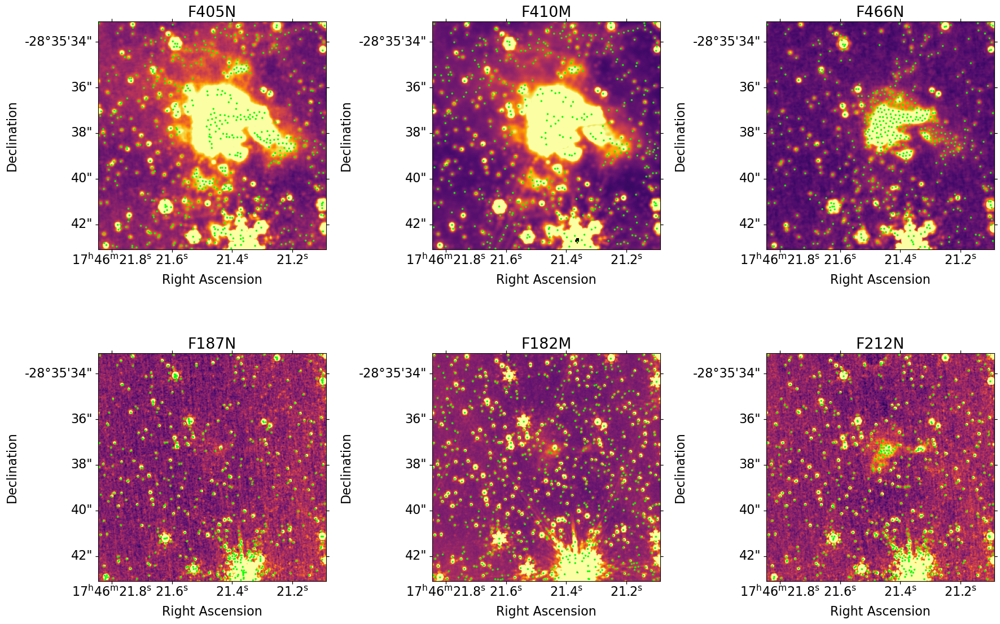

In [25]:
fig = plt.figure(figsize=(18, 12))

ax1 = plt.subplot(231, projection=cutout_405.wcs)
ax1.imshow(cutout_405.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(crds_in_405.ra, crds_in_405.dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2)
ax1.set_title('F405N')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(232, projection=cutout_410.wcs)
ax2.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax2.scatter(crds_in_410.ra, crds_in_410.dec, edgecolor='lime', facecolor='none', transform=ax2.get_transform('world'), s=2)
ax2.set_title('F410M')
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

ax3 = plt.subplot(233, projection=cutout_466.wcs)
ax3.imshow(cutout_466.data, vmin=0, vmax=25, cmap='inferno')
ax3.scatter(crds_in_466.ra, crds_in_466.dec, edgecolor='lime', facecolor='none', transform=ax3.get_transform('world'), s=2)
ax3.set_title('F466N')
ax3.set_xlabel('Right Ascension')
ax3.set_ylabel('Declination')

ax4 = plt.subplot(234, projection=cutout_187.wcs)
ax4.imshow(cutout_187.data, vmin=0, vmax=25, cmap='inferno')
ax4.scatter(crds_in_187.ra, crds_in_187.dec, edgecolor='lime', facecolor='none', transform=ax4.get_transform('world'), s=2)
ax4.set_title('F187N')
ax4.set_xlabel('Right Ascension')
ax4.set_ylabel('Declination')

ax5 = plt.subplot(235, projection=cutout_182.wcs)
ax5.imshow(cutout_182.data, vmin=0, vmax=10, cmap='inferno')
ax5.scatter(crds_in_182.ra, crds_in_182.dec, edgecolor='lime', facecolor='none', transform=ax5.get_transform('world'), s=2)
ax5.set_title('F182M')
ax5.set_xlabel('Right Ascension')
ax5.set_ylabel('Declination')

ax6 = plt.subplot(236, projection=cutout_212.wcs)
ax6.imshow(cutout_212.data, vmin=0, vmax=25, cmap='inferno')
ax6.scatter(crds_in_212.ra, crds_in_212.dec, edgecolor='lime', facecolor='none', transform=ax6.get_transform('world'), s=2)
ax6.set_title('F212N')
ax6.set_xlabel('Right Ascension')
ax6.set_ylabel('Declination')

plt.tight_layout()
plt.show()

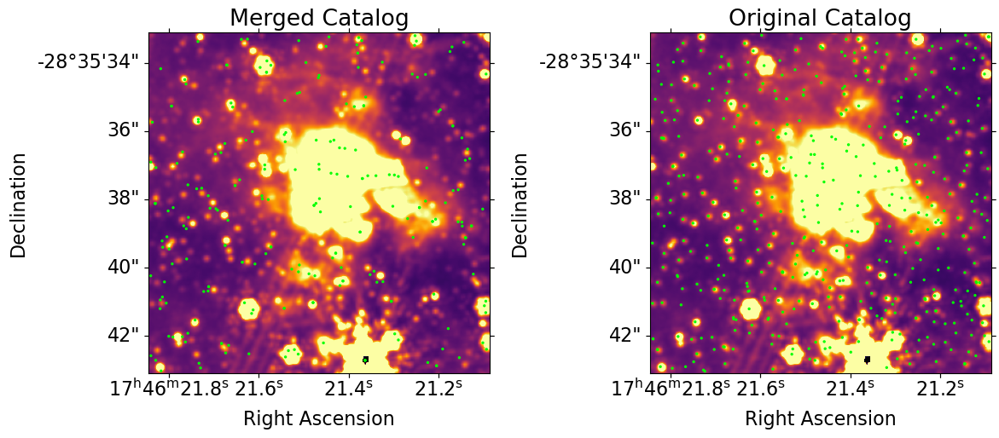

In [45]:
fig = plt.figure(figsize=(12, 6))

ax1 = plt.subplot(121, projection=cutout_410.wcs)
ax1.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(base_in[mask_410]['skycoord_f410m'].ra, base_in[mask_410]['skycoord_f410m'].dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2)
ax1.set_title('Merged Catalog')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(122, projection=cutout_410.wcs)
ax2.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax2.scatter(crds_in_410.ra, crds_in_410.dec, edgecolor='lime', facecolor='none', transform=ax2.get_transform('world'), s=2)
ax2.set_title('Original Catalog')
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

plt.tight_layout()
plt.show()

# Daophot

In [27]:
cat_405 = Table.read('/orange/adamginsburg/jwst/cloudc/F405N/f405n_merged_daophot_basic.fits')
cat_410 = Table.read('/orange/adamginsburg/jwst/cloudc/F410M/f410m_merged_daophot_basic.fits')
cat_466 = Table.read('/orange/adamginsburg/jwst/cloudc/F466N/f466n_merged_daophot_basic.fits')
cat_187 = Table.read('/orange/adamginsburg/jwst/cloudc/F187N/f187n_merged_daophot_basic.fits')
cat_182 = Table.read('/orange/adamginsburg/jwst/cloudc/F182M/f182m_merged_daophot_basic.fits')
cat_212 = Table.read('/orange/adamginsburg/jwst/cloudc/F212N/f212n_merged_daophot_basic.fits')

In [28]:
crds_405 = cat_405['skycoord_centroid']
crds_410 = cat_410['skycoord_centroid']
crds_466 = cat_466['skycoord_centroid']
crds_187 = cat_187['skycoord_centroid']
crds_182 = cat_182['skycoord_centroid']
crds_212 = cat_212['skycoord_centroid']

In [29]:
crds_in_405 = crds_405[reg_cloudc.contains(crds_405, wcs=rgb_wcs)]
crds_in_410 = crds_410[reg_cloudc.contains(crds_410, wcs=rgb_wcs)]
crds_in_466 = crds_466[reg_cloudc.contains(crds_466, wcs=rgb_wcs)]
crds_in_187 = crds_187[reg_cloudc.contains(crds_187, wcs=rgb_wcs)]
crds_in_182 = crds_182[reg_cloudc.contains(crds_182, wcs=rgb_wcs)]
crds_in_212 = crds_212[reg_cloudc.contains(crds_212, wcs=rgb_wcs)]

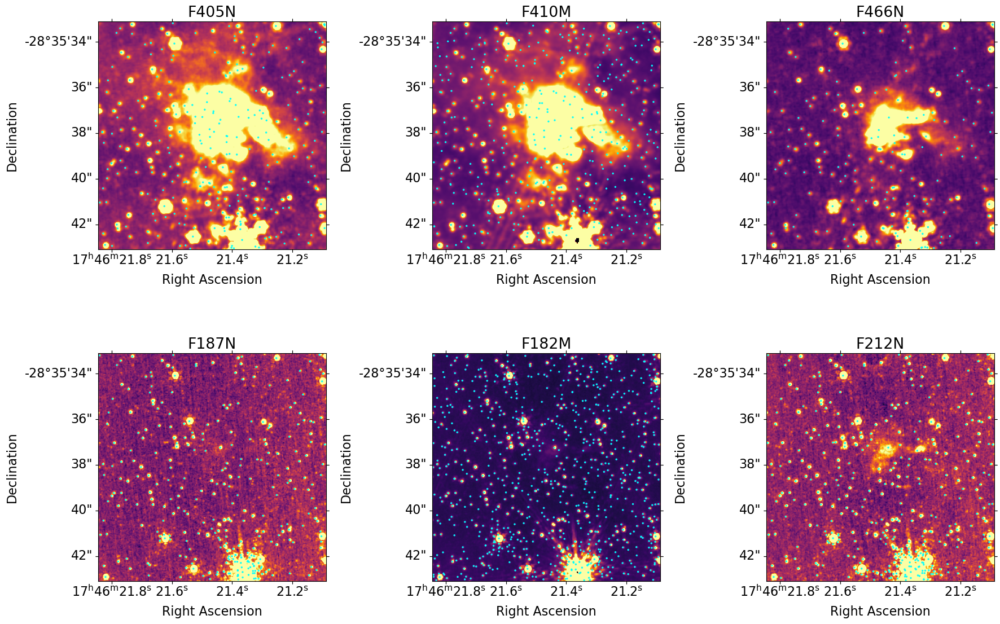

In [30]:
fig = plt.figure(figsize=(18, 12))

ax1 = plt.subplot(231, projection=cutout_405.wcs)
ax1.imshow(cutout_405.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(crds_in_405.ra, crds_in_405.dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2)
ax1.set_title('F405N')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(232, projection=cutout_410.wcs)
ax2.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax2.scatter(crds_in_410.ra, crds_in_410.dec, edgecolor='cyan', facecolor='none', transform=ax2.get_transform('world'), s=2)
ax2.set_title('F410M')
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

ax3 = plt.subplot(233, projection=cutout_466.wcs)
ax3.imshow(cutout_466.data, vmin=0, vmax=25, cmap='inferno')
ax3.scatter(crds_in_466.ra, crds_in_466.dec, edgecolor='cyan', facecolor='none', transform=ax3.get_transform('world'), s=2)
ax3.set_title('F466N')
ax3.set_xlabel('Right Ascension')
ax3.set_ylabel('Declination')

ax4 = plt.subplot(234, projection=cutout_187.wcs)
ax4.imshow(cutout_187.data, vmin=0, vmax=25, cmap='inferno')
ax4.scatter(crds_in_187.ra, crds_in_187.dec, edgecolor='cyan', facecolor='none', transform=ax4.get_transform('world'), s=2)
ax4.set_title('F187N')
ax4.set_xlabel('Right Ascension')
ax4.set_ylabel('Declination')

ax5 = plt.subplot(235, projection=cutout_182.wcs)
ax5.imshow(cutout_182.data, vmin=0, vmax=25, cmap='inferno')
ax5.scatter(crds_in_182.ra, crds_in_182.dec, edgecolor='cyan', facecolor='none', transform=ax5.get_transform('world'), s=2)
ax5.set_title('F182M')
ax5.set_xlabel('Right Ascension')
ax5.set_ylabel('Declination')

ax6 = plt.subplot(236, projection=cutout_212.wcs)
ax6.imshow(cutout_212.data, vmin=0, vmax=25, cmap='inferno')
ax6.scatter(crds_in_212.ra, crds_in_212.dec, edgecolor='cyan', facecolor='none', transform=ax6.get_transform('world'), s=2)
ax6.set_title('F212N')
ax6.set_xlabel('Right Ascension')
ax6.set_ylabel('Declination')

plt.tight_layout()
plt.show()

In [46]:
dao_basic = Table.read('/orange/adamginsburg/jwst/cloudc/catalogs/iterative_merged_photometry_tables_merged.fits')

In [47]:
crds_dao = dao_basic['skycoord_ref']
dao_basic_in = dao_basic[reg_cloudc.contains(crds_dao, wcs=rgb_wcs)]
crds_dao_in = crds_dao[reg_cloudc.contains(crds_dao, wcs=rgb_wcs)]

In [50]:
mask_dao_410 = ~np.isnan(dao_basic_in['mag_ab_f410m'])

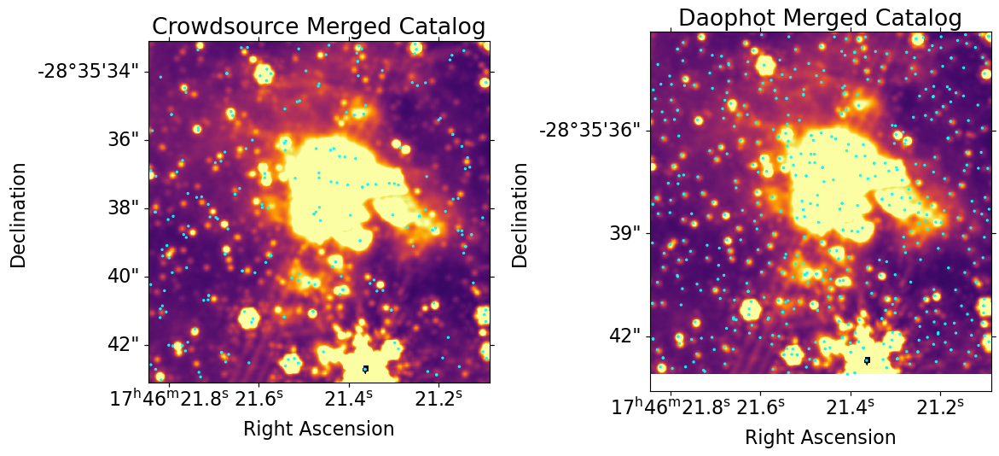

In [49]:
fig = plt.figure(figsize=(12, 6))

ax1 = plt.subplot(121, projection=cutout_410.wcs)
ax1.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(base_in[mask_410]['skycoord_f410m'].ra, base_in[mask_410]['skycoord_f410m'].dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2)
ax1.set_title('Crowdsource Merged Catalog')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(122, projection=cutout_410.wcs)
ax2.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax2.scatter(dao_basic_in[mask_dao_410]['skycoord_f410m'].ra, dao_basic_in[mask_dao_410]['skycoord_f410m'].dec, edgecolor='cyan', facecolor='none', transform=ax2.get_transform('world'), s=2)
ax2.set_title('Daophot Merged Catalog')
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

plt.tight_layout()
plt.show()

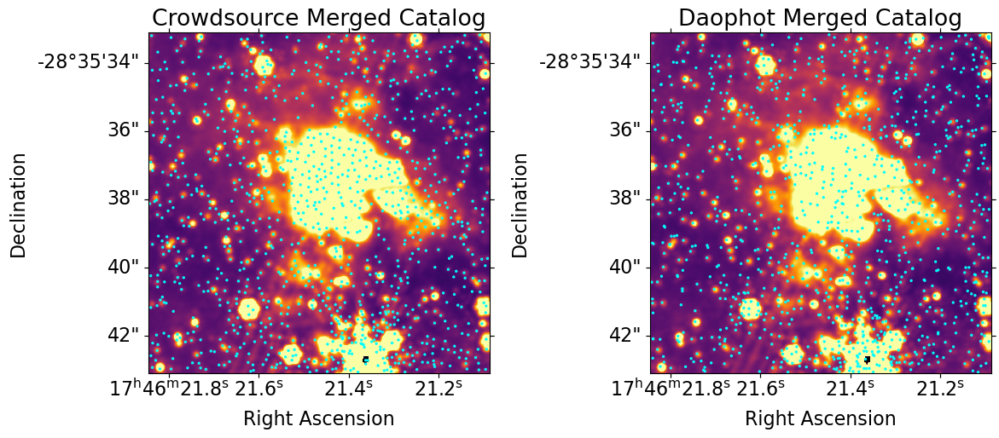

In [51]:
fig = plt.figure(figsize=(12, 6))

ax1 = plt.subplot(121, projection=cutout_410.wcs)
ax1.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(base_in['skycoord_ref'].ra, base_in['skycoord_ref'].dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2)
ax1.set_title('Crowdsource Merged Catalog')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(122, projection=cutout_410.wcs)
ax2.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax2.scatter(dao_basic_in['skycoord_ref'].ra, dao_basic_in['skycoord_ref'].dec, edgecolor='cyan', facecolor='none', transform=ax2.get_transform('world'), s=2)
ax2.set_title('Daophot Merged Catalog')
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

plt.tight_layout()
plt.show()

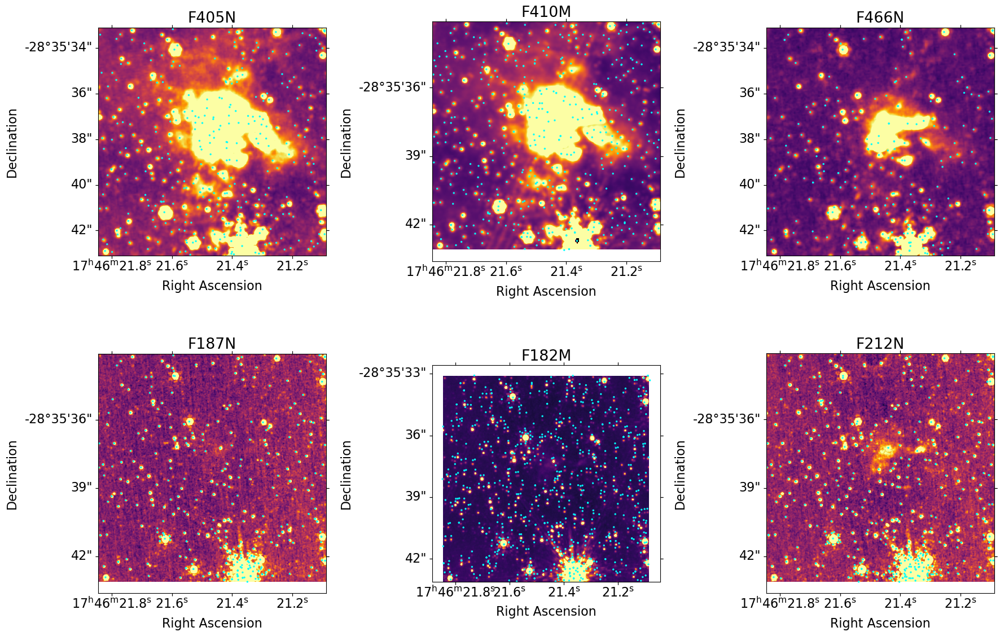

In [35]:
fig = plt.figure(figsize=(18, 12))

mask_dao_405 = ~np.isnan(dao_basic_in['mag_ab_f405n'])
mask_dao_410 = ~np.isnan(dao_basic_in['mag_ab_f410m'])
mask_dao_466 = ~np.isnan(dao_basic_in['mag_ab_f466n'])
mask_dao_187 = ~np.isnan(dao_basic_in['mag_ab_f187n'])
mask_dao_182 = ~np.isnan(dao_basic_in['mag_ab_f182m'])
mask_dao_212 = ~np.isnan(dao_basic_in['mag_ab_f212n'])

ax1 = plt.subplot(231, projection=cutout_405.wcs)
ax1.imshow(cutout_405.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(dao_basic_in[mask_dao_405]['skycoord_f405n'].ra, dao_basic_in[mask_dao_405]['skycoord_f405n'].dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2)
ax1.set_title('F405N')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(232, projection=cutout_410.wcs)
ax2.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax2.scatter(dao_basic_in[mask_dao_410]['skycoord_f410m'].ra, dao_basic_in[mask_dao_410]['skycoord_f410m'].dec, edgecolor='cyan', facecolor='none', transform=ax2.get_transform('world'), s=2)
ax2.set_title('F410M')
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

ax3 = plt.subplot(233, projection=cutout_466.wcs)
ax3.imshow(cutout_466.data, vmin=0, vmax=25, cmap='inferno')
ax3.scatter(dao_basic_in[mask_dao_466]['skycoord_f466n'].ra, dao_basic_in[mask_dao_466]['skycoord_f466n'].dec, edgecolor='cyan', facecolor='none', transform=ax3.get_transform('world'), s=2)
ax3.set_title('F466N')
ax3.set_xlabel('Right Ascension')
ax3.set_ylabel('Declination')

ax4 = plt.subplot(234, projection=cutout_187.wcs)
ax4.imshow(cutout_187.data, vmin=0, vmax=25, cmap='inferno')
ax4.scatter(dao_basic_in[mask_dao_187]['skycoord_f187n'].ra, dao_basic_in[mask_dao_187]['skycoord_f187n'].dec, edgecolor='cyan', facecolor='none', transform=ax4.get_transform('world'), s=2)
ax4.set_title('F187N')
ax4.set_xlabel('Right Ascension')
ax4.set_ylabel('Declination')

ax5 = plt.subplot(235, projection=cutout_182.wcs)
ax5.imshow(cutout_182.data, vmin=0, vmax=25, cmap='inferno')
ax5.scatter(dao_basic_in[mask_dao_182]['skycoord_f182m'].ra, dao_basic_in[mask_dao_182]['skycoord_f182m'].dec, edgecolor='cyan', facecolor='none', transform=ax5.get_transform('world'), s=2)
ax5.set_title('F182M')
ax5.set_xlabel('Right Ascension')
ax5.set_ylabel('Declination')

ax6 = plt.subplot(236, projection=cutout_212.wcs)
ax6.imshow(cutout_212.data, vmin=0, vmax=25, cmap='inferno')
ax6.scatter(dao_basic_in[mask_dao_212]['skycoord_f212n'].ra, dao_basic_in[mask_dao_212]['skycoord_f212n'].dec, edgecolor='cyan', facecolor='none', transform=ax6.get_transform('world'), s=2)
ax6.set_title('F212N')
ax6.set_xlabel('Right Ascension')
ax6.set_ylabel('Declination')

plt.tight_layout()
plt.show()

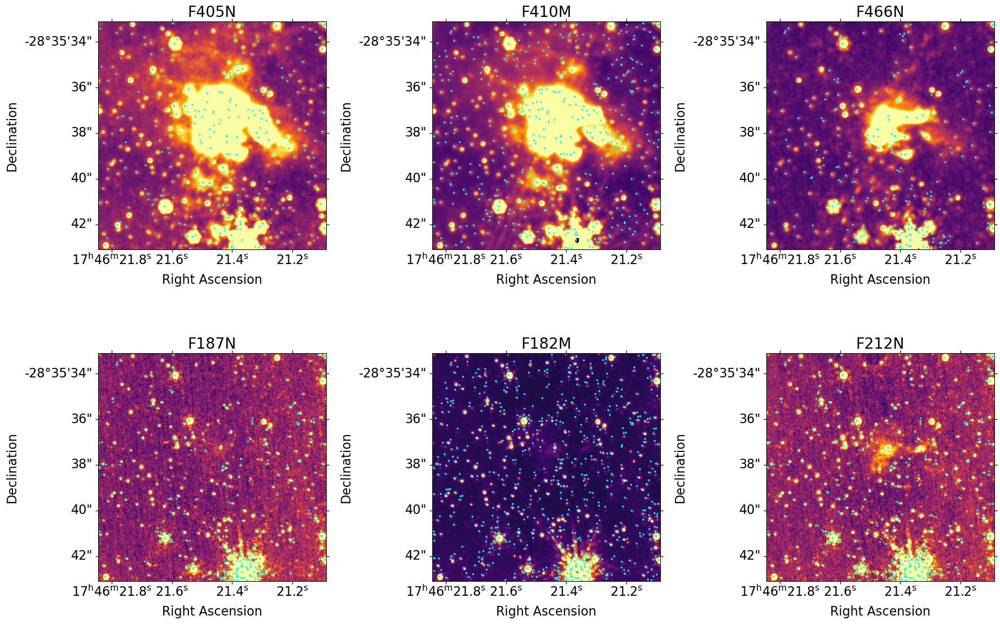

In [36]:
fig = plt.figure(figsize=(18, 12))

mask_dao_405 = ~np.isnan(dao_basic_in['mag_ab_f405n'])
mask_dao_410 = ~np.isnan(dao_basic_in['mag_ab_f410m'])
mask_dao_466 = ~np.isnan(dao_basic_in['mag_ab_f466n'])
mask_dao_187 = ~np.isnan(dao_basic_in['mag_ab_f187n'])
mask_dao_182 = ~np.isnan(dao_basic_in['mag_ab_f182m'])
mask_dao_212 = ~np.isnan(dao_basic_in['mag_ab_f212n'])

ax1 = plt.subplot(231, projection=cutout_405.wcs)
ax1.imshow(cutout_405.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(dao_basic_in[mask_dao_405]['skycoord_f405n'].ra, dao_basic_in[mask_dao_405]['skycoord_f405n'].dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2)
ax1.set_title('F405N')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax2 = plt.subplot(232, projection=cutout_410.wcs)
ax2.imshow(cutout_410.data, vmin=0, vmax=25, cmap='inferno')
ax2.scatter(dao_basic_in[mask_dao_410]['skycoord_ref'].ra, dao_basic_in[mask_dao_410]['skycoord_ref'].dec, edgecolor='cyan', facecolor='none', transform=ax2.get_transform('world'), s=2)
ax2.set_title('F410M')
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')

ax3 = plt.subplot(233, projection=cutout_466.wcs)
ax3.imshow(cutout_466.data, vmin=0, vmax=25, cmap='inferno')
ax3.scatter(dao_basic_in[mask_dao_466]['skycoord_ref'].ra, dao_basic_in[mask_dao_466]['skycoord_ref'].dec, edgecolor='cyan', facecolor='none', transform=ax3.get_transform('world'), s=2)
ax3.set_title('F466N')
ax3.set_xlabel('Right Ascension')
ax3.set_ylabel('Declination')

ax4 = plt.subplot(234, projection=cutout_187.wcs)
ax4.imshow(cutout_187.data, vmin=0, vmax=25, cmap='inferno')
ax4.scatter(dao_basic_in[mask_dao_187]['skycoord_ref'].ra, dao_basic_in[mask_dao_187]['skycoord_ref'].dec, edgecolor='cyan', facecolor='none', transform=ax4.get_transform('world'), s=2)
ax4.set_title('F187N')
ax4.set_xlabel('Right Ascension')
ax4.set_ylabel('Declination')

ax5 = plt.subplot(235, projection=cutout_182.wcs)
ax5.imshow(cutout_182.data, vmin=0, vmax=25, cmap='inferno')
ax5.scatter(dao_basic_in[mask_dao_182]['skycoord_ref'].ra, dao_basic_in[mask_dao_182]['skycoord_ref'].dec, edgecolor='cyan', facecolor='none', transform=ax5.get_transform('world'), s=2)
ax5.set_title('F182M')
ax5.set_xlabel('Right Ascension')
ax5.set_ylabel('Declination')

ax6 = plt.subplot(236, projection=cutout_212.wcs)
ax6.imshow(cutout_212.data, vmin=0, vmax=25, cmap='inferno')
ax6.scatter(dao_basic_in[mask_dao_212]['skycoord_ref'].ra, dao_basic_in[mask_dao_212]['skycoord_ref'].dec, edgecolor='cyan', facecolor='none', transform=ax6.get_transform('world'), s=2)
ax6.set_title('F212N')
ax6.set_xlabel('Right Ascension')
ax6.set_ylabel('Declination')

plt.tight_layout()
plt.show()

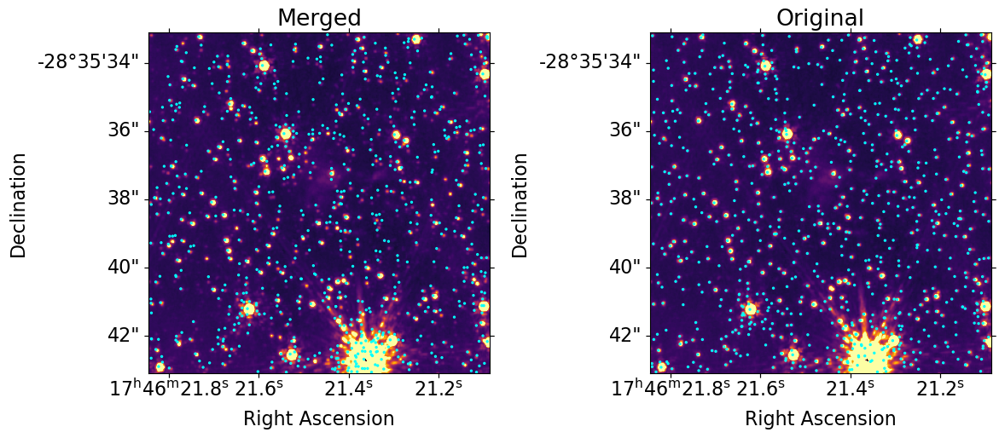

In [37]:
fig = plt.figure(figsize=(12, 6))

ax1 = plt.subplot(121, projection=cutout_182.wcs)
ax1.imshow(cutout_182.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(dao_basic_in[mask_dao_182]['skycoord_ref'].ra, dao_basic_in[mask_dao_182]['skycoord_ref'].dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2)
ax1.set_title('Merged')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax5 = plt.subplot(122, projection=cutout_182.wcs)
ax5.imshow(cutout_182.data, vmin=0, vmax=25, cmap='inferno')
ax5.scatter(crds_in_182.ra, crds_in_182.dec, edgecolor='cyan', facecolor='none', transform=ax5.get_transform('world'), s=2)
ax5.set_title('Original')
ax5.set_xlabel('Right Ascension')
ax5.set_ylabel('Declination')

plt.tight_layout()
plt.show()

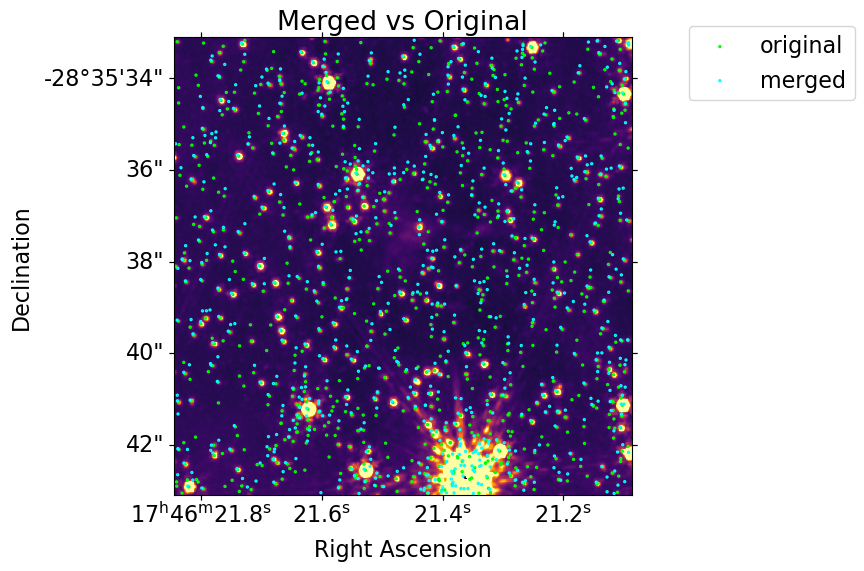

In [38]:
fig = plt.figure(figsize=(12, 6))

ax1 = plt.subplot(111, projection=cutout_182.wcs)
ax1.imshow(cutout_182.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(crds_in_182.ra, crds_in_182.dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2, label='original')
ax1.scatter(dao_basic_in[mask_dao_182]['skycoord_ref'].ra, dao_basic_in[mask_dao_182]['skycoord_ref'].dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2, label='merged')
ax1.set_title('Merged vs Original')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax1.legend(bbox_to_anchor=(1.1, 1.05))

plt.tight_layout()
plt.show()

In [39]:
cutout_182.wcs.world_to_pixel(position)

(array(159.06552029), array(159.17521414))

In [40]:
position

<SkyCoord (ICRS): (ra, dec) in deg
    (266.58944571, -28.59391996)>

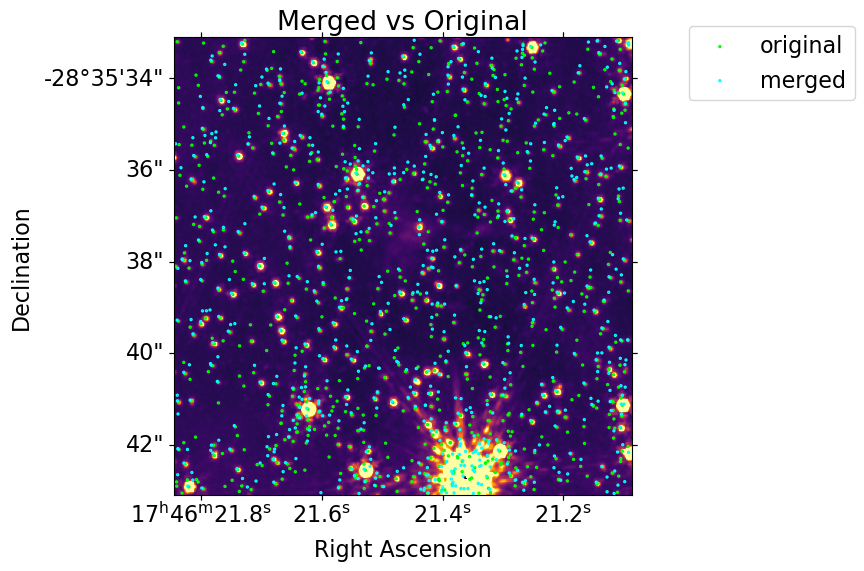

In [41]:
fig = plt.figure(figsize=(12, 6))

ax1 = plt.subplot(111, projection=cutout_182.wcs)
ax1.imshow(cutout_182.data, vmin=0, vmax=25, cmap='inferno')
ax1.scatter(crds_in_182.ra, crds_in_182.dec, edgecolor='lime', facecolor='none', transform=ax1.get_transform('world'), s=2, label='original')
ax1.scatter(dao_basic_in[mask_dao_182]['skycoord_ref'].ra, dao_basic_in[mask_dao_182]['skycoord_ref'].dec, edgecolor='cyan', facecolor='none', transform=ax1.get_transform('world'), s=2, label='merged')
ax1.set_title('Merged vs Original')
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')

ax1.legend(bbox_to_anchor=(1.1, 1.05))

plt.tight_layout()
plt.show()

In [42]:
print(

SyntaxError: unexpected EOF while parsing (149104261.py, line 1)

# Data Difference Examination

In [ ]:
diff_405_410 = cutout_405.data - cutout_410.data
diff_410_405 = cutout_410.data - cutout_405.data
diff_187_182 = cutout_187.data - cutout_182.data
diff_182_187 = cutout_182.data - cutout_187.data

In [ ]:
fig = plt.figure(figsize=(24, 12))

ax = plt.subplot(231, projection=cutout_405.wcs)
im = ax.imshow(cutout_405.data, vmin=0, vmax=50)
ax.set_xlabel('Right Ascension')
ax.set_ylabel('Declination')
cbar = fig.colorbar(im)
cbar.ax.set_ylabel('F405N', rotation=90)

ax1 = plt.subplot(232, projection=cutout_405.wcs)
im1 = ax1.imshow(diff_405_410, vmin=0, vmax=5)
ax1.set_xlabel('Right Ascension')
ax1.set_ylabel('Declination')
cbar = fig.colorbar(im1)
cbar.ax.set_ylabel('F405N - F410M', rotation=90)

ax2 = plt.subplot(233, projection=cutout_405.wcs)
im2 = ax2.imshow(diff_410_405, vmin=0, vmax=1)
ax2.set_xlabel('Right Ascension')
ax2.set_ylabel('Declination')
cbar = fig.colorbar(im2)
cbar.ax.set_ylabel('F410M - F405N', rotation=90)

ax5 = plt.subplot(234, projection=cutout_182.wcs)
im5 = ax5.imshow(cutout_187.data, vmin=0, vmax=25)
ax5.set_xlabel('Right Ascension')
ax5.set_ylabel('Declination')
cbar = fig.colorbar(im5)
cbar.ax.set_ylabel('F410M - F405N', rotation=90)

ax3 = plt.subplot(235, projection=cutout_187.wcs)
im3 = ax3.imshow(diff_187_182, vmin=0, vmax=10)
ax3.set_xlabel('Right Ascension')
ax3.set_ylabel('Declination')
cbar = fig.colorbar(im3)
cbar.ax.set_ylabel('F187N - F182M', rotation=90)

ax4 = plt.subplot(236, projection=cutout_187.wcs)
im4 = ax4.imshow(diff_182_187, vmin=0, vmax=1)
ax4.set_xlabel('Right Ascension')
ax4.set_ylabel('Declination')
cbar = fig.colorbar(im4)
cbar.ax.set_ylabel('F182M - F187N', rotation=90)

plt.tight_layout()
plt.show()